##### Import necessary libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

In [40]:
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

In [46]:
from sklearn.cluster import KMeans

In [76]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [137]:
from sklearn.cluster import DBSCAN

In [145]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [3]:
df=pd.read_csv('DS3_C6_S3_Clustering_AbsenteeismAtWork_Data_Project.csv',sep=';')

In [18]:
df.head()

,ID,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,...,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,11,26,7,3,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,4
1,36,0,7,3,1,118,13,18,50,239.554,...,1,1,1,1,0,0,98,178,31,0
2,3,23,7,4,1,179,51,18,38,239.554,...,0,1,0,1,0,0,89,170,31,2
3,7,7,7,5,1,279,5,14,39,239.554,...,0,1,2,1,1,0,68,168,24,4
4,11,23,7,5,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,2


In [24]:
# since we do not need the ID column for our analsis, we can drop it
df.drop('ID',axis=1,inplace=True)

In [25]:
# Checking shape of the dataframe
df.shape

(740, 20)

In [26]:
# Checking the info of columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 740 entries, 0 to 739
Data columns (total 20 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Reason for absence               740 non-null    int64  
 1   Month of absence                 740 non-null    int64  
 2   Day of the week                  740 non-null    int64  
 3   Seasons                          740 non-null    int64  
 4   Transportation expense           740 non-null    int64  
 5   Distance from Residence to Work  740 non-null    int64  
 6   Service time                     740 non-null    int64  
 7   Age                              740 non-null    int64  
 8   Work load Average/day            740 non-null    float64
 9   Hit target                       740 non-null    int64  
 10  Disciplinary failure             740 non-null    int64  
 11  Education                        740 non-null    int64  
 12  Son                   

In [27]:
# Describing the dataframe
df.describe()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
count,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000
mean,19.216216,6.324324,3.914865,2.544595,221.329730,29.631081,12.554054,36.450000,271.490235,94.587838,0.054054,1.291892,1.018919,0.567568,0.072973,0.745946,79.035135,172.114865,26.677027,6.924324
std,8.433406,3.436287,1.421675,1.111831,66.952223,14.836788,4.384873,6.478772,39.058116,3.779313,0.226277,0.673238,1.098489,0.495749,0.260268,1.318258,12.883211,6.034995,4.285452,13.330998
min,0.000000,0.000000,2.000000,1.000000,118.000000,5.000000,1.000000,27.000000,205.917000,81.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,56.000000,163.000000,19.000000,0.000000
25%,13.000000,3.000000,3.000000,2.000000,179.000000,16.000000,9.000000,31.000000,244.387000,93.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,69.000000,169.000000,24.000000,2.000000
50%,23.000000,6.000000,4.000000,3.000000,225.000000,26.000000,13.000000,37.000000,264.249000,95.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,83.000000,170.000000,25.000000,3.000000
75%,26.000000,9.000000,5.000000,4.000000,260.000000,50.000000,16.000000,40.000000,294.217000,97.000000,0.000000,1.000000,2.000000,1.000000,0.000000,1.000000,89.000000,172.000000,31.000000,8.000000
max,28.000000,12.000000,6.000000,4.000000,388.000000,52.000000,29.000000,58.000000,378.884000,100.000000,1.000000,4.000000,4.000000,1.000000,1.000000,8.000000,108.000000,196.000000,38.000000,120.000000


##### Checking for null values in data

In [28]:
df.isnull().sum()

Reason for absence                 0
Month of absence                   0
Day of the week                    0
Seasons                            0
Transportation expense             0
Distance from Residence to Work    0
Service time                       0
Age                                0
Work load Average/day              0
Hit target                         0
Disciplinary failure               0
Education                          0
Son                                0
Social drinker                     0
Social smoker                      0
Pet                                0
Weight                             0
Height                             0
Body mass index                    0
Absenteeism time in hours          0
dtype: int64

##### Performing necessary visualizations

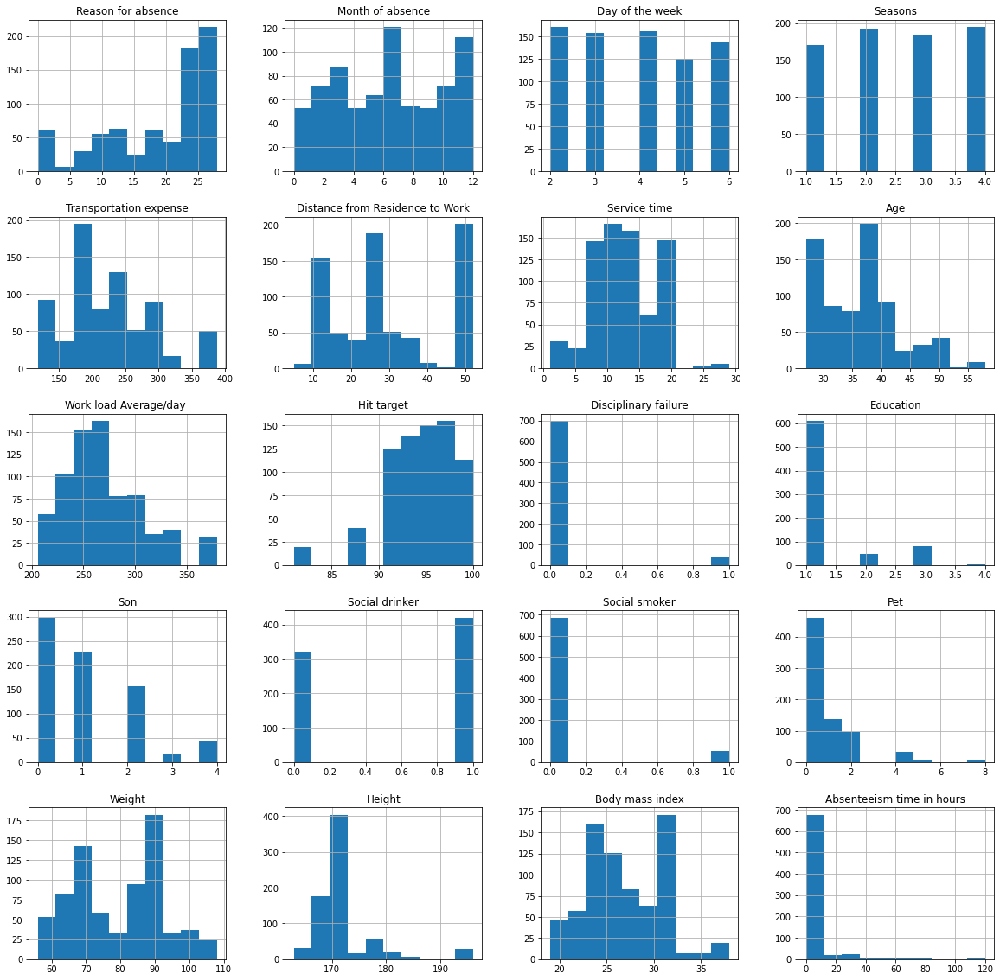

In [30]:
df.hist(figsize=(20,20))
plt.show()

##### Conclusions

In [31]:
# 1) Reason for absence had most of its distribution from 23-28.
# 2) Most employees took absence in the month of July followed by December
# 3) Monday accounted for the maximum absenteeism day while thursday was the minimum.
# 4) Season(4) accounted for the maximum absenteeism.
# 5) 175-200 accounted for the maximum transportation expense.
# 6) Distance from work of 47-52 units had the maximum absenteeism.
# 7) Service time of 9-12 noticed the maximum absenteeism.
# 8) Age 37-39 years noticed the maximum absenteeism.
# 9) Workload avg/day noticed maximum absenteeism in 260-275 range.
# 10) 96-97 hit target noticed the maximum distribution.
# 11) Most employees did not face any disciplinary failures.
# 12) Education(1) had the maximum distribution.
# 13) Most employees had 0 son.
# 14) Most employees were social drikers.
# 15) Most employees were not social smokers.
# 16) Most employees had no pets.
# 17) 87-92 weight noticed maximum absenteeism
# 18) Height of 169-172 noticed the maximum distribution.
# 19) 30-32 BMI noticed the maximum absenteeism followed by 23-25.
# 20) 0-10 hours noticed the maximum absenteeism

In [5]:
sb.scatterplot(data=df,x='Work load Average/day',y='Age')

ValueError: Could not interpret value `Work load Average/day` for parameter `x`

In [35]:
# Since our dataset only has numerics, there is no need for encoding, we can simply proceed with scaling our data.

In [36]:
# Since none of our columns are normally distributed, we permorm min-max scaling.

In [37]:
numerics=['int16','int32','int64','float16','float32','float64']

In [38]:
new_df=df.select_dtypes(include=numerics)

In [41]:
scaler=MinMaxScaler()

In [42]:
df_scaled=pd.DataFrame(scaler.fit_transform(new_df.to_numpy()),columns=new_df.columns)

In [43]:
df_scaled.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,0.928571,0.583333,0.25,0.0,0.633333,0.659574,0.428571,0.193548,0.194471,0.842105,0.0,0.0,0.50,1.0,0.0,0.125,0.653846,0.272727,0.578947,0.033333
1,0.000000,0.583333,0.25,0.0,0.000000,0.170213,0.607143,0.741935,0.194471,0.842105,1.0,0.0,0.25,1.0,0.0,0.000,0.807692,0.454545,0.631579,0.000000
2,0.821429,0.583333,0.50,0.0,0.225926,0.978723,0.607143,0.354839,0.194471,0.842105,0.0,0.0,0.00,1.0,0.0,0.000,0.634615,0.212121,0.631579,0.016667
3,0.250000,0.583333,0.75,0.0,0.596296,0.000000,0.464286,0.387097,0.194471,0.842105,0.0,0.0,0.50,1.0,1.0,0.000,0.230769,0.151515,0.263158,0.033333
4,0.821429,0.583333,0.75,0.0,0.633333,0.659574,0.428571,0.193548,0.194471,0.842105,0.0,0.0,0.50,1.0,0.0,0.125,0.653846,0.272727,0.578947,0.016667


In [44]:
# Taking our features
X=df_scaled.copy()

### 1) Performing KMeans Clustering

##### Finding optimum value of K using elbow method

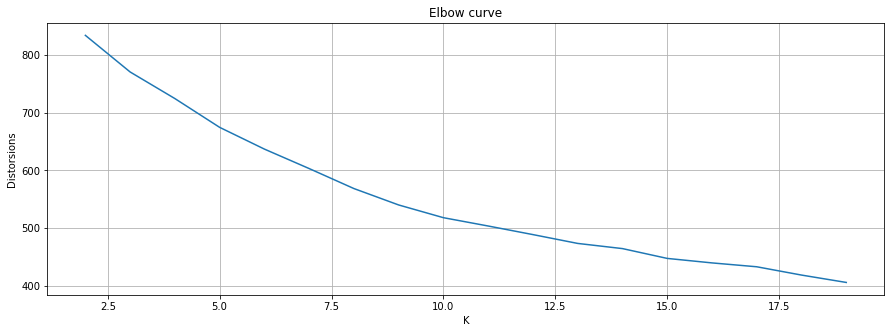

In [48]:
distorsions = []
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.xlabel('K')
plt.ylabel('Distorsions')
plt.title('Elbow curve');

##### By using the elbow method we can infer that the optimum value of K is 8

##### Finding optimum value of K using Silhoutte method

For n_clusters = 2 The average silhouette_score is : 0.21258804028166942
For n_clusters = 3 The average silhouette_score is : 0.1707420980394835
For n_clusters = 4 The average silhouette_score is : 0.14902747535467784
For n_clusters = 5 The average silhouette_score is : 0.18837552371655303
For n_clusters = 6 The average silhouette_score is : 0.15768305467420796
For n_clusters = 7 The average silhouette_score is : 0.17056679044763695
For n_clusters = 8 The average silhouette_score is : 0.16664898230355485
For n_clusters = 9 The average silhouette_score is : 0.16521740067437937
For n_clusters = 10 The average silhouette_score is : 0.17621959745673774


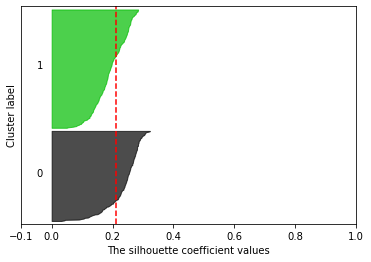

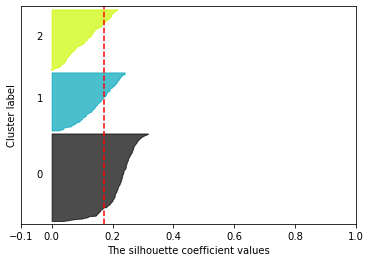

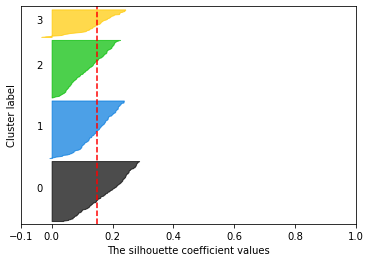

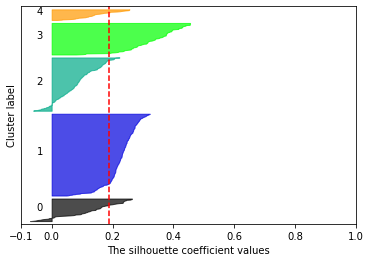

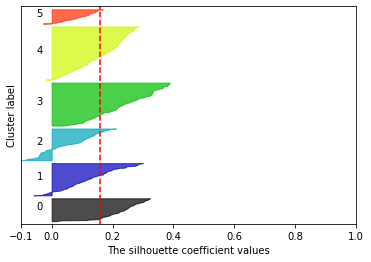

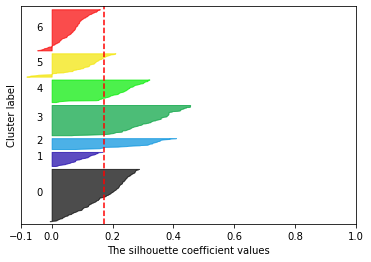

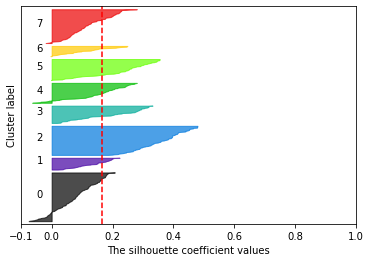

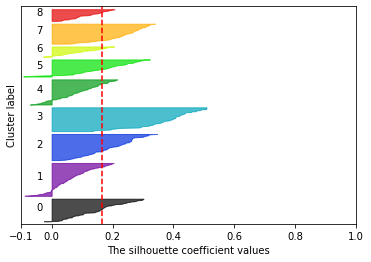

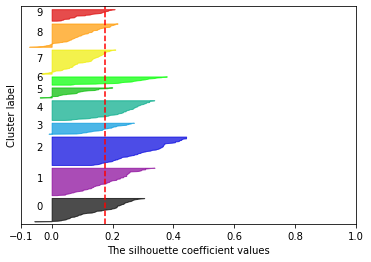

In [49]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2, 3, 4, 5, 6, 7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)  # silhoutte score
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

##### The optimal value for K using silhoutte method is K=5, as it has the highest silhouette score

##### Therefore we build our KMeans model with K=7

In [59]:
Kmeans_model = KMeans(n_clusters=7,random_state=0)
Kmeans_model.fit(X)

KMeans(n_clusters=7, random_state=0)

In [69]:
clusterer = KMeans(n_clusters=7, random_state=0)
cluster_labels = clusterer.fit_predict(X)
silhouette_avg_KM = silhouette_score(X, cluster_labels)  # silhoutte score
print("The average silhouette_score is :", silhouette_avg_KM)

The average silhouette_score is : 0.17269730568936645


##### Obtaining cluster centroids

In [60]:
cluster_centroid = Kmeans_model.cluster_centers_
cluster_centroid

array([[ 6.59937888e-01,  4.69202899e-01,  5.16304348e-01,
         3.91304348e-01,  3.84541063e-01,  4.22294172e-01,
         4.67391304e-01,  3.97615708e-01,  3.75906336e-01,
         7.57437071e-01,  0.00000000e+00,  1.44927536e-01,
         4.13043478e-01,  3.69565217e-01,  1.00000000e+00,
         1.22282609e-01,  2.58361204e-01,  2.83926219e-01,
         2.35697941e-01,  6.35869565e-02],
       [ 7.38158900e-01,  5.88680927e-01,  5.33422460e-01,
         4.99108734e-01,  6.34759358e-01,  6.96211173e-01,
         3.58861727e-01,  2.68069691e-01,  3.81624710e-01,
         6.75485505e-01,  7.63278329e-17,  1.24777184e-02,
         4.50534759e-01,  1.00000000e+00, -2.77555756e-17,
         1.50401070e-01,  3.51398601e-01,  2.31891104e-01,
         3.35491134e-01,  7.45098039e-02],
       [ 8.24874687e-01,  4.61257310e-01,  4.73684211e-01,
         4.50292398e-01,  2.33073424e-01,  9.77603583e-01,
         6.14035088e-01,  3.61063950e-01,  3.34125646e-01,
         7.40535549e-01,  4.8

In [61]:
labels1 = Kmeans_model.labels_
labels1

array([1, 4, 2, 0, 1, 2, 1, 1, 6, 5, 1, 1, 1, 2, 2, 1, 2, 2, 5, 5, 5, 2,
       1, 1, 1, 1, 1, 0, 1, 2, 2, 0, 5, 0, 2, 1, 1, 1, 0, 1, 5, 5, 2, 6,
       6, 5, 2, 1, 1, 1, 4, 4, 3, 3, 4, 4, 3, 2, 4, 3, 2, 1, 2, 3, 4, 3,
       2, 3, 3, 3, 3, 1, 2, 3, 1, 1, 3, 1, 1, 1, 2, 3, 2, 0, 1, 6, 3, 1,
       3, 6, 3, 0, 3, 1, 3, 3, 1, 1, 3, 3, 6, 3, 3, 1, 3, 1, 3, 1, 3, 1,
       3, 1, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 1, 5,
       5, 5, 5, 5, 1, 5, 1, 2, 6, 5, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 1, 1, 0, 0, 1, 1, 5, 5, 1, 0, 6, 1, 6, 1, 0, 1, 5, 0, 2, 5, 5,
       5, 5, 5, 2, 0, 5, 5, 5, 1, 5, 6, 1, 6, 5, 1, 2, 6, 1, 1, 1, 5, 1,
       1, 6, 0, 1, 5, 4, 1, 6, 6, 2, 5, 5, 6, 2, 1, 4, 4, 4, 4, 2, 6, 1,
       1, 1, 1, 1, 1, 2, 6, 1, 6, 5, 6, 6, 0, 2, 2, 5, 6, 6, 5, 5, 5, 5,
       6, 5, 5, 0, 1, 1, 2, 1, 1, 4, 1, 0, 1, 5, 0, 0, 1, 1, 5, 5, 5, 6,
       5, 5, 6, 5, 1, 5, 2, 2, 1, 4, 1, 1, 4, 4, 2, 1, 2, 1, 1, 6, 6, 4,
       1, 1, 2, 1, 3, 1, 1, 4, 4, 3, 3, 1, 2, 3, 4,

In [62]:
df['KMeans-Labels']=labels1

In [63]:
df['KMeans-Labels'].value_counts()

5    197
1    187
2    114
3     79
6     77
0     46
4     40
Name: KMeans-Labels, dtype: int64

##### From the KMeans cluster we can infer that our 5th cluster had the maximum frequency of data while the 4th cluster had the minimum

In [205]:
%matplotlib notebook
clusterer = KMeans(n_clusters=7, random_state=0)
cluster_labels = clusterer.fit_predict(df_scaled)

df['cluster'] = cluster_labels

sb.set_palette("bright")
sb.pairplot(df, kind="scatter", hue ="cluster", corner=True)
plt.show()

<IPython.core.display.Javascript object>

### 2.1) Performing Hierarchial Clustering (ward)

##### Plotting Dendrogram

<IPython.core.display.Javascript object>


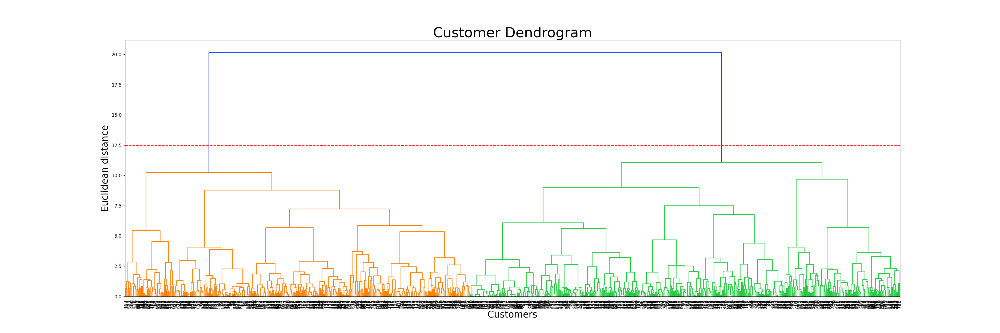

In [74]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.axhline(y=12.5, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### By using the dendrogram we can say that the ideal number of clusters is 2

##### Fitting Agglomerative model with 2 clusters

In [78]:
hc1 = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
y_hc1 = hc.fit_predict(X)

In [79]:
y_hc1

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0,

In [80]:
df['Agglomerative-Labels']=y_hc1

In [81]:
df['Agglomerative-Labels'].value_counts()

0    411
1    329
Name: Agglomerative-Labels, dtype: int64

In [82]:
silhouette_score(X, y_hc1)

0.1979551670763572

##### From our silhouette score we can say that aglomerative clustering with ward linkage was the better clustering model compared to KMeans

### 2.2) Performing Hierarchial Clustering (single)

##### Plotting Dendrogram

<IPython.core.display.Javascript object>


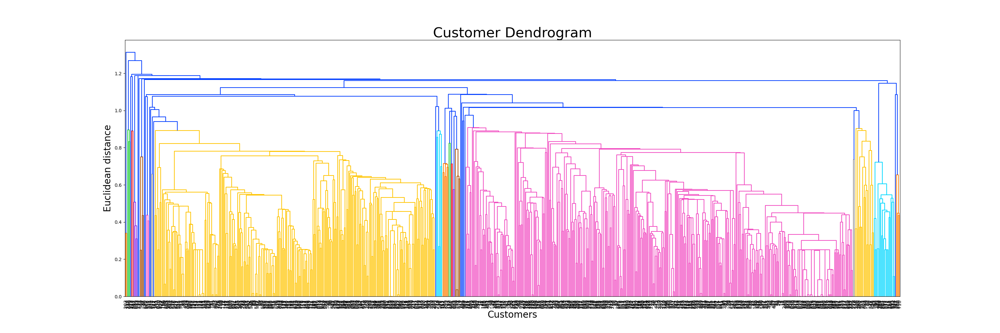

In [85]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(X, method = 'single'))
plt.axhline(y=12.5, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### By visually looking at the dendrogram we can not identify the appropriate number of clusters so we shall try with a range 10-20 and respectivey check their silhouette scores

##### Fitting into agglomerative models

In [94]:
for i in range(2,21):
    hc_test=AgglomerativeClustering(n_clusters = i, affinity = 'euclidean', linkage = 'single')
    y_hc_test=hc_test.fit_predict(X)
    print('Silhouette score for',i,'clusters is:',silhouette_score(X, y_hc_test))

Silhouette score for 2 clusters is: 0.2501884496324095
Silhouette score for 3 clusters is: 0.23651298899161932
Silhouette score for 4 clusters is: 0.20957479386916578
Silhouette score for 5 clusters is: 0.053842962365973655
Silhouette score for 6 clusters is: 0.03675596625460221
Silhouette score for 7 clusters is: 0.033826504047724235
Silhouette score for 8 clusters is: 0.026814673026721768
Silhouette score for 9 clusters is: 0.02133555689613947
Silhouette score for 10 clusters is: 0.009481990213260781
Silhouette score for 11 clusters is: 0.013715654669142924
Silhouette score for 12 clusters is: 0.009688102974074199
Silhouette score for 13 clusters is: 0.1243026399655973
Silhouette score for 14 clusters is: 0.134295745938026
Silhouette score for 15 clusters is: 0.13231913525778666
Silhouette score for 16 clusters is: 0.1302608724852809
Silhouette score for 17 clusters is: 0.1309513283849658
Silhouette score for 18 clusters is: 0.13504694976326392
Silhouette score for 19 clusters is: 0.

##### Therefore we can say that our ideal number of clusters is 18

In [107]:
hc2 = AgglomerativeClustering(n_clusters = 18, affinity = 'euclidean', linkage = 'single')
y_hc2 = hc2.fit_predict(X)

In [108]:
df['Agglomerative-Labels (single)']=y_hc2

In [109]:
df['Agglomerative-Labels (single)'].value_counts()

2     394
3     273
12     20
6      17
1       7
8       4
7       4
16      4
0       4
5       3
13      2
17      2
9       1
15      1
10      1
11      1
14      1
4       1
Name: Agglomerative-Labels (single), dtype: int64

##### We can see that the clustering distribution is very poor with 2 clusters having the vast majority of data while the rest are negligible

In [110]:
silhouette_score(X, y_hc2)

0.13504694976326392

##### We can see that the resultant silhouette score is inferior to the ward linkage model

### 2.3) Performing Aglomerative Clustering (Complete)

##### Plotting Dendrogram

<IPython.core.display.Javascript object>


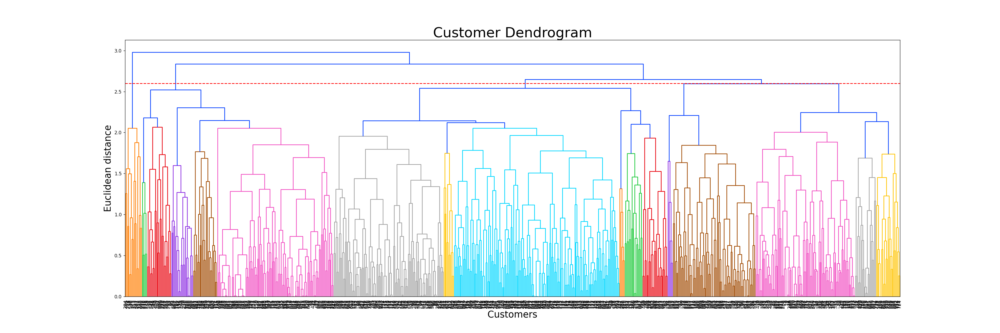

In [112]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(X, method = 'complete'))
plt.axhline(y=2.6, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### From the dendrogram we can see that the ideal number of clusters is 4

##### Fitting Agglomerative model with 4 clusters

In [116]:
hc3 = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'complete')
y_hc3 = hc3.fit_predict(X)

In [117]:
df['Agglomerative-Labels (complete)']=y_hc3

In [118]:
df['Agglomerative-Labels (complete)'].value_counts()

1    319
0    222
2    183
3     16
Name: Agglomerative-Labels (complete), dtype: int64

##### Therefore we can see that 4 clusters were formed with the 1st cluster having the maximum data and the 3rd cluster having the least

In [119]:
silhouette_score(X, y_hc3)

0.13013728801856334

##### However we see that it has a silhouette score less than ward and single linkage

### 2.4) Performing Aglomerative Clustering (Average)

<IPython.core.display.Javascript object>


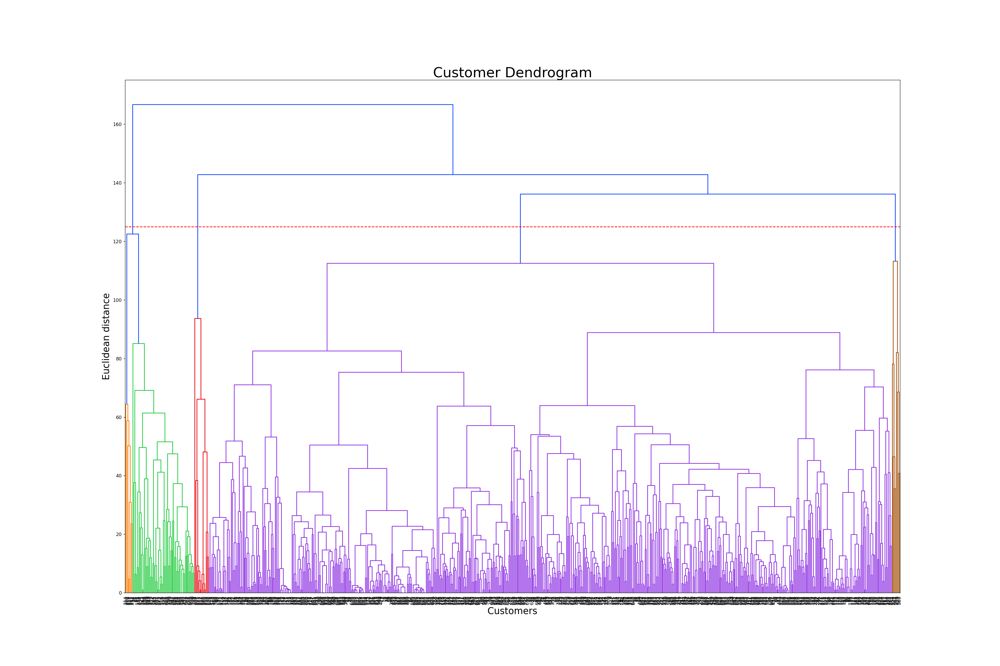

In [125]:
plt.figure(figsize=(30, 20))
dendrogrm = sch.dendrogram(sch.linkage(new_df, method = 'average'))
plt.axhline(y=125, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### From the dendrogram we can see that 4 is the ideal number of clusters

##### Fitting agglomerative model with 4 clusters

In [126]:
hc4 = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'average')
y_hc4 = hc4.fit_predict(X)

In [127]:
df['Agglomerative-Labels (average)']=y_hc4

In [128]:
df['Agglomerative-Labels (average)'].value_counts()

0    694
2     37
1      8
3      1
Name: Agglomerative-Labels (average), dtype: int64

##### We can see that there is vast difference in the data distribution among the 4 clusters

In [129]:
silhouette_score(X, y_hc4)

0.14086871637657836

##### We can see that average linkage gives better silhouette score compared to single and complete linkage but inferior to ward linkage

### 3) Performing DBSCAN Clustering

##### Making knee graph to identify optimum values of hyperparameters

In [134]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)

<IPython.core.display.Javascript object>


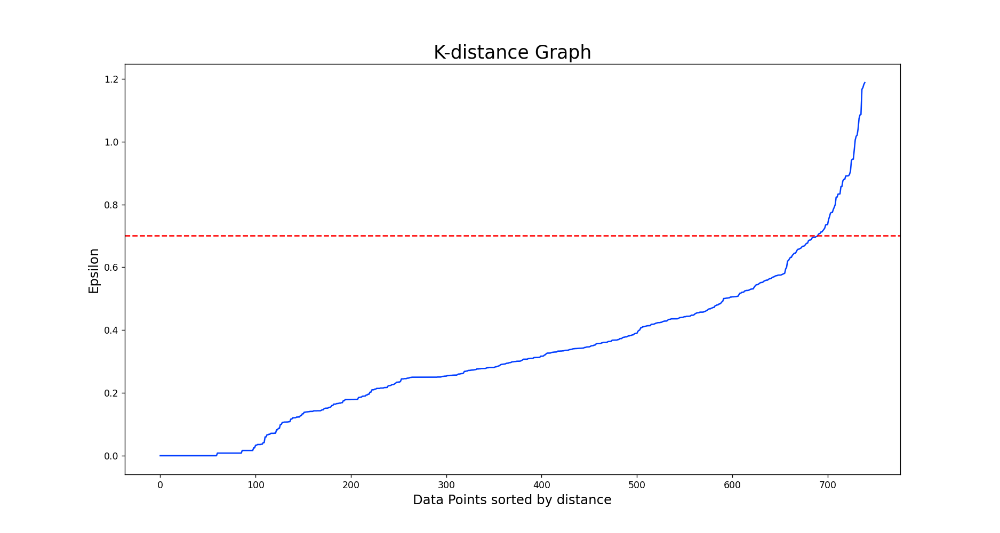

In [135]:
# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(15,8))
plt.plot(distances)
plt.axhline(y=0.7, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

##### From the knee graph we can say that the ideal value of epsilon is 0.7

In [140]:
eps=0.7
for min_samples in [15,16,17,18,19,20,21,22,23,24,25]:
 clusterer = DBSCAN(eps=eps, min_samples=min_samples)
 cluster_labels = clusterer.fit_predict(X)
 x= cluster_labels +2
 y = np.bincount(x)
 ii = np.nonzero(y)[0]
 results = list(zip(ii,y[ii]) )
 print('eps=',eps,'| min_samples= ', min_samples, '| obtained clustering: ', results)


eps= 0.7 | min_samples=  15 | obtained clustering:  [(1, 357), (2, 29), (3, 103), (4, 88), (5, 51), (6, 43), (7, 34), (8, 16), (9, 19)]
eps= 0.7 | min_samples=  16 | obtained clustering:  [(1, 362), (2, 29), (3, 103), (4, 87), (5, 51), (6, 43), (7, 30), (8, 16), (9, 19)]
eps= 0.7 | min_samples=  17 | obtained clustering:  [(1, 390), (2, 103), (3, 20), (4, 87), (5, 49), (6, 43), (7, 29), (8, 19)]
eps= 0.7 | min_samples=  18 | obtained clustering:  [(1, 415), (2, 103), (3, 86), (4, 48), (5, 29), (6, 40), (7, 19)]
eps= 0.7 | min_samples=  19 | obtained clustering:  [(1, 415), (2, 103), (3, 86), (4, 48), (5, 29), (6, 40), (7, 19)]
eps= 0.7 | min_samples=  20 | obtained clustering:  [(1, 449), (2, 103), (3, 86), (4, 29), (5, 37), (6, 36)]
eps= 0.7 | min_samples=  21 | obtained clustering:  [(1, 458), (2, 103), (3, 86), (4, 21), (5, 37), (6, 35)]
eps= 0.7 | min_samples=  22 | obtained clustering:  [(1, 482), (2, 102), (3, 84), (4, 37), (5, 35)]
eps= 0.7 | min_samples=  23 | obtained clusteri

##### Therefore we can say that the ideal value of min samples is 22

##### Applying DBSCAN algorithm with eps=0.7 and min samples=22

In [142]:
dbscan_opt=DBSCAN(eps=0.7,min_samples=22)
dbscan_opt.fit(X)

DBSCAN(eps=0.7, min_samples=22)

In [143]:
df['DBSCAN_opt_labels']=dbscan_opt.labels_
df['DBSCAN_opt_labels'].value_counts()

-1    482
 0    102
 1     84
 2     37
 3     35
Name: DBSCAN_opt_labels, dtype: int64

##### We see that the DBSCAN algorithm has treated most of the data points as outliers and created 4 distinct clusters

In [144]:
silhouette_score(X, dbscan_opt.labels_)

0.01844582128536595

##### We can see that using the DBSCAN algorithm has yielded the worst silhouette score till now

## Since none of our clustering models have yielded a high silhouette score, we must perform feature reduction using PCA and LDA

### Performing PCA

In [146]:
pca=PCA(n_components=2)  # Reduced features/components (PCA1 & PCA2)
df_r=pca.fit(df_scaled).transform(df_scaled)
explained_variance=pca.explained_variance_ratio_
explained_variance

array([0.22278234, 0.12283926])

In [147]:
df_r

array([[-0.57416397, -0.4164923 ],
       [-0.44641816, -0.07187438],
       [-0.6432152 , -0.53915042],
       ...,
       [-0.35969486, -0.47447172],
       [-0.58311177, -0.15949316],
       [ 0.37911923,  0.02970801]])

In [148]:
df_r.shape

(740, 2)

##### Visualizing PCA

<IPython.core.display.Javascript object>


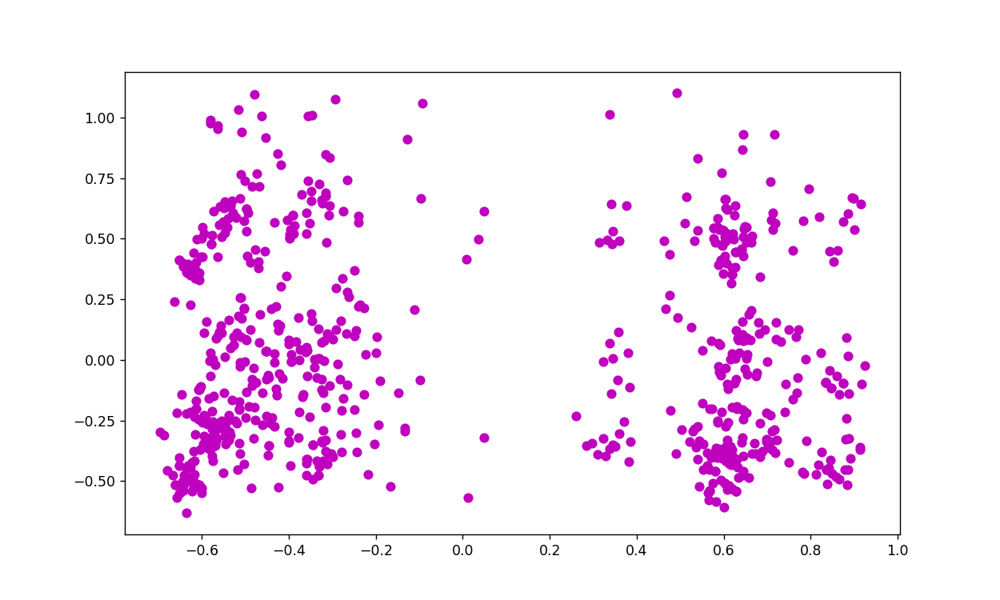

In [149]:
plt.figure(figsize=(10,6))
plt.scatter(x=df_r[:,0],y=df_r[:,1],c='m')

### Performing LDA

##### Let us consider reason for absence as our target variable and the rest of the columns as the features

In [150]:
df_scaled.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,0.928571,0.583333,0.25,0.0,0.633333,0.659574,0.428571,0.193548,0.194471,0.842105,0.0,0.0,0.50,1.0,0.0,0.125,0.653846,0.272727,0.578947,0.033333
1,0.000000,0.583333,0.25,0.0,0.000000,0.170213,0.607143,0.741935,0.194471,0.842105,1.0,0.0,0.25,1.0,0.0,0.000,0.807692,0.454545,0.631579,0.000000
2,0.821429,0.583333,0.50,0.0,0.225926,0.978723,0.607143,0.354839,0.194471,0.842105,0.0,0.0,0.00,1.0,0.0,0.000,0.634615,0.212121,0.631579,0.016667
3,0.250000,0.583333,0.75,0.0,0.596296,0.000000,0.464286,0.387097,0.194471,0.842105,0.0,0.0,0.50,1.0,1.0,0.000,0.230769,0.151515,0.263158,0.033333
4,0.821429,0.583333,0.75,0.0,0.633333,0.659574,0.428571,0.193548,0.194471,0.842105,0.0,0.0,0.50,1.0,0.0,0.125,0.653846,0.272727,0.578947,0.016667


In [167]:
X1=df_scaled.iloc[:,1:]
y1=df['Reason for absence']

In [168]:
len(y1.value_counts())

28

In [181]:
lda=LinearDiscriminantAnalysis(n_components=2)  #n_components=no. of classes-1
X_r2=lda.fit(X1,y1).transform(X1)

In [182]:
X_r2

array([[ 1.10585997e+00, -1.32790414e+00],
       [-1.58099007e+01,  2.48859061e-01],
       [ 1.03144333e+00,  1.31273763e+00],
       ...,
       [-1.40079653e+00, -6.89711631e-01],
       [ 3.92820022e-03,  5.29052177e-01],
       [ 2.67649304e-01,  2.07436840e+00]])

<IPython.core.display.Javascript object>


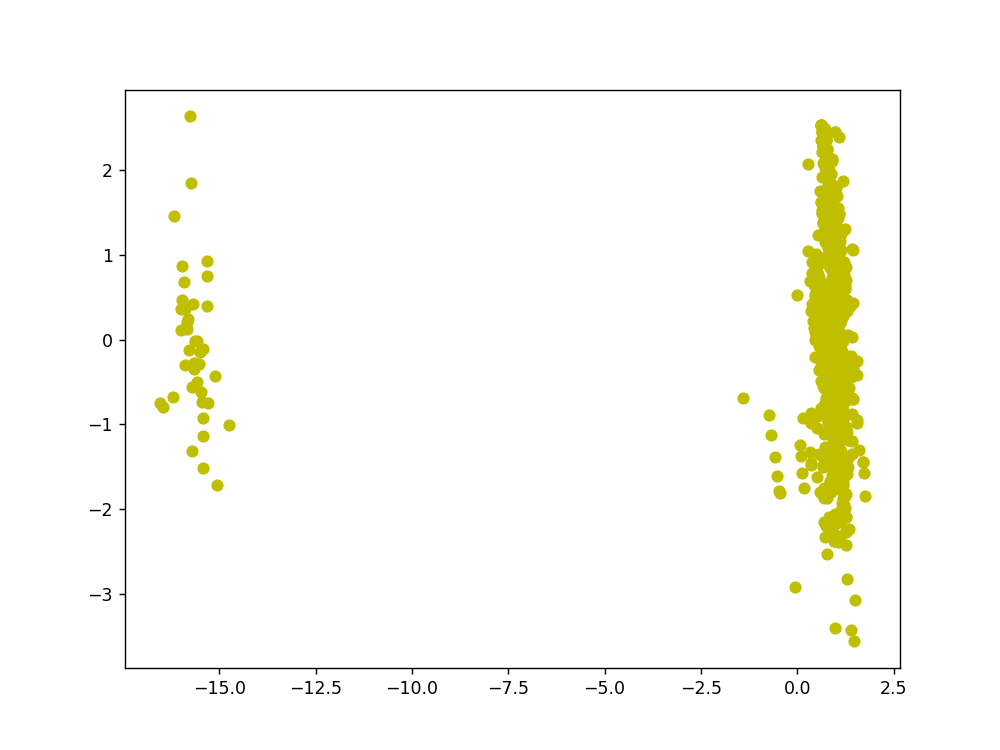

In [185]:
plt.figure(figsize=(8,6))
plt.scatter(X_r2[:,0],X_r2[:,1],c='y')

##### Since our model didn't have any specified labels we proceed with the results obtained using PCA

In [209]:
rf_df=pd.DataFrame()

In [210]:
rf_df['RF1']=df_r[:,0]
rf_df['RF2']=df_r[:,1]

### 4) Performing KMeans clustering with reduced features

<IPython.core.display.Javascript object>


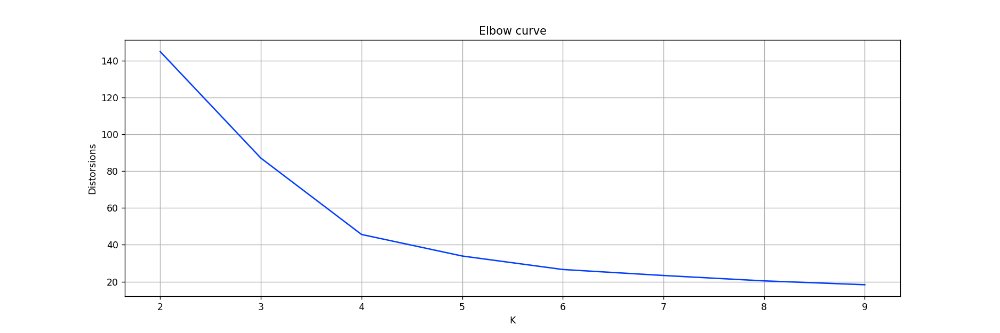

In [191]:
distorsions = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_r)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 10), distorsions)
plt.grid(True)
plt.xlabel('K')
plt.ylabel('Distorsions')
plt.title('Elbow curve');

##### Therefore from the elbow curve we can say that the ideal value of k is 4

##### Finding optimum value of K using silhouette score

<IPython.core.display.Javascript object>


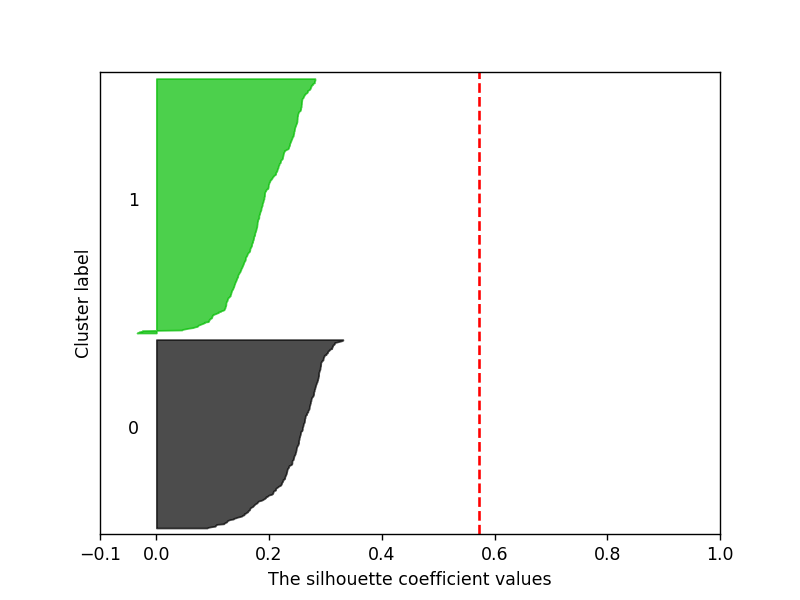

For n_clusters = 2 The average silhouette_score is : 0.5729920935260224


<IPython.core.display.Javascript object>


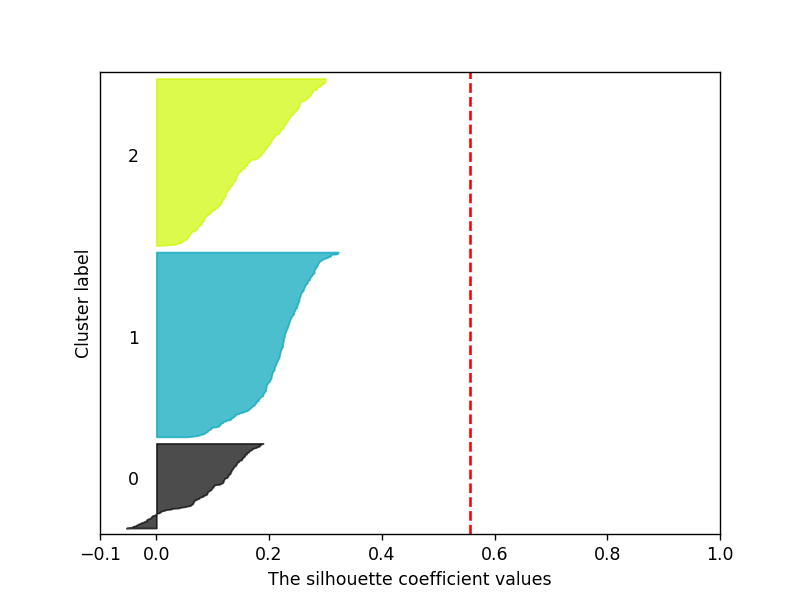

For n_clusters = 3 The average silhouette_score is : 0.555704494750934


<IPython.core.display.Javascript object>


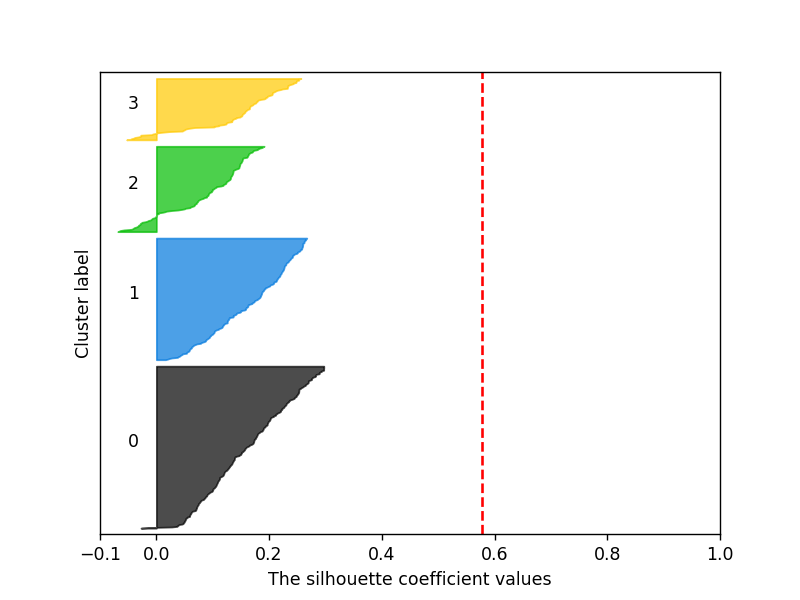

For n_clusters = 4 The average silhouette_score is : 0.5772576491948678


<IPython.core.display.Javascript object>


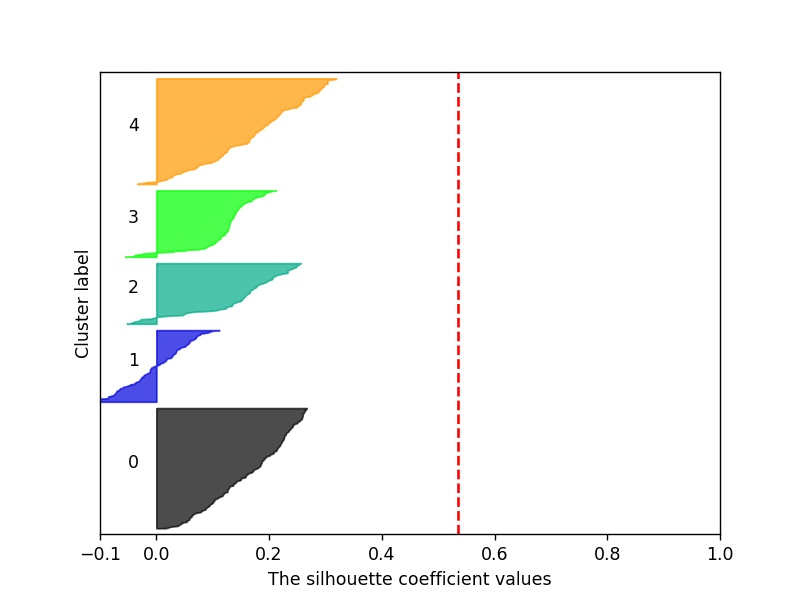

For n_clusters = 5 The average silhouette_score is : 0.5351462364270995


<IPython.core.display.Javascript object>


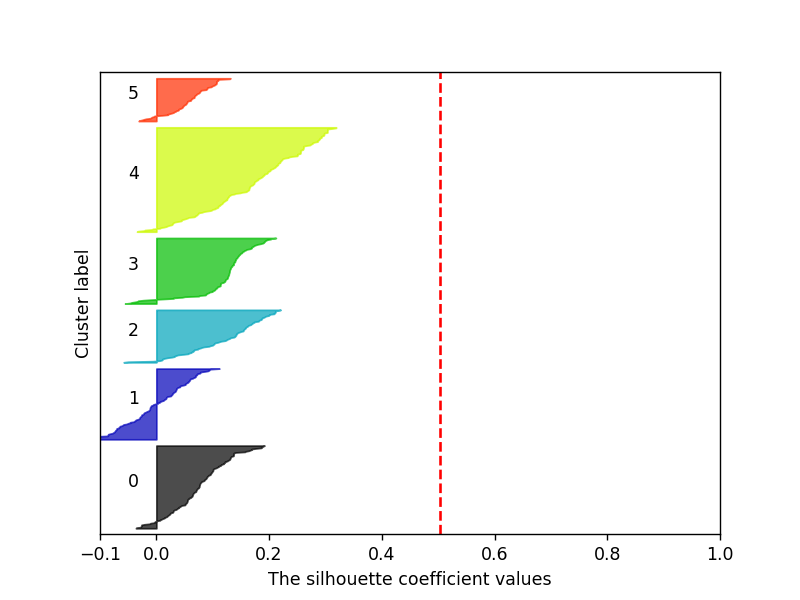

For n_clusters = 6 The average silhouette_score is : 0.5036194554027674


<IPython.core.display.Javascript object>


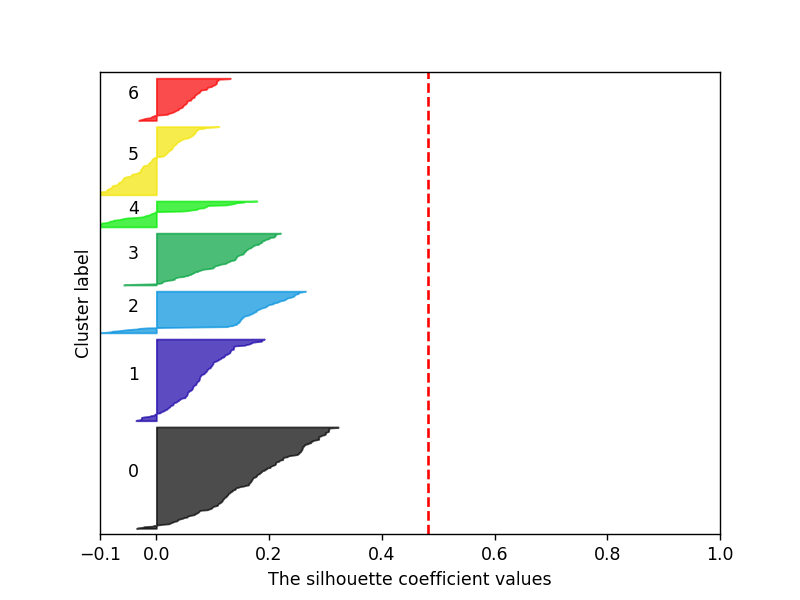

For n_clusters = 7 The average silhouette_score is : 0.48112910047277985


<IPython.core.display.Javascript object>


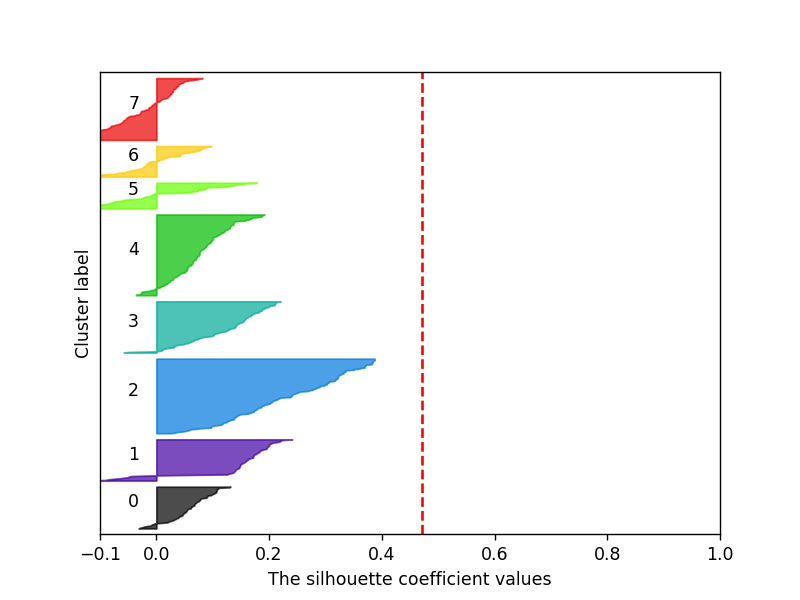

For n_clusters = 8 The average silhouette_score is : 0.4711703876377683


<IPython.core.display.Javascript object>


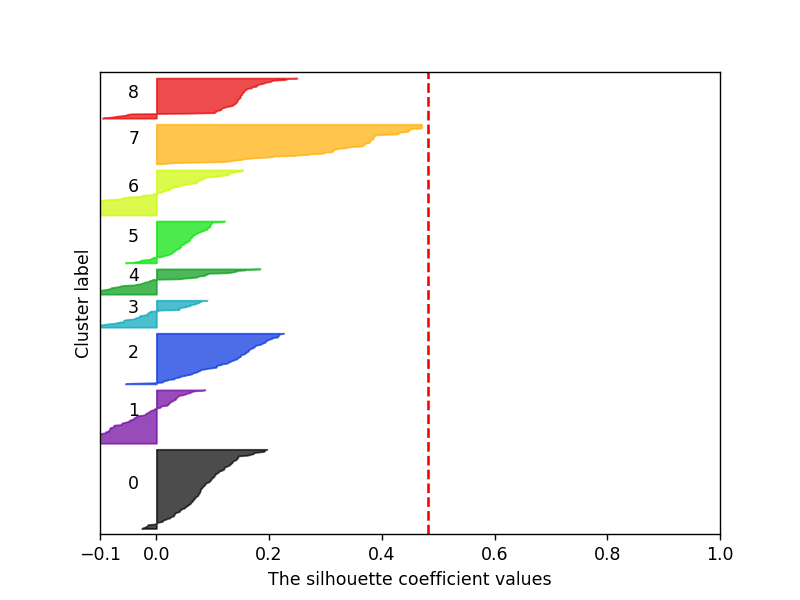

For n_clusters = 9 The average silhouette_score is : 0.4819226633749384


<IPython.core.display.Javascript object>


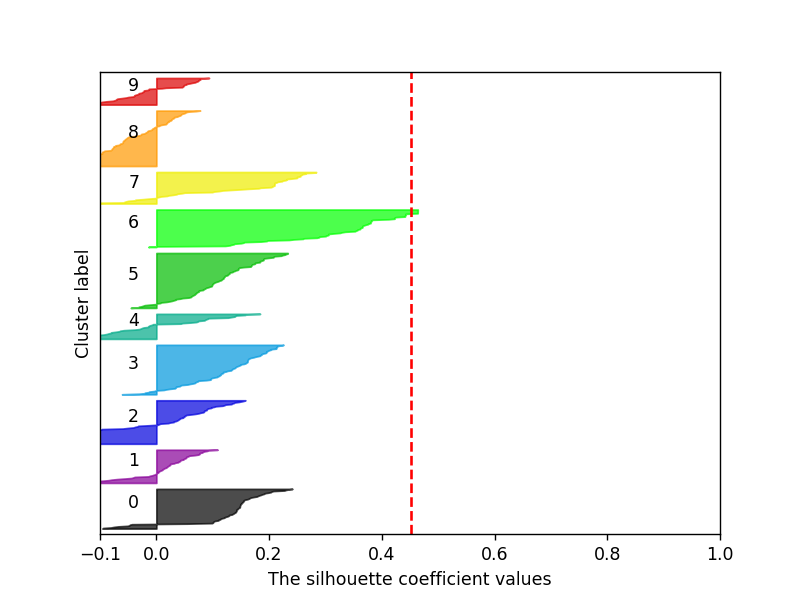

For n_clusters = 10 The average silhouette_score is : 0.451272341728984


In [192]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2, 3, 4, 5, 6, 7,8,9,10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_r) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_r)

    silhouette_avg = silhouette_score(df_r, cluster_labels)  # silhoutte score
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

##### Therefore we can say that the ideal value for n_clusters is 4 with a silhouette score of 0.577

##### Therefore we fit the KMeans model with k=4

In [194]:
Kmeans_model_reduced = KMeans(n_clusters=4,random_state=0)
Kmeans_model_reduced.fit(df_r)

KMeans(n_clusters=4, random_state=0)

In [195]:
clusterer = KMeans(n_clusters=4, random_state=0)
cluster_labels = clusterer.fit_predict(df_r)
silhouette_avg_KM_reduced = silhouette_score(df_r, cluster_labels)  # silhoutte score
print("The average silhouette_score is :", silhouette_avg_KM_reduced)

The average silhouette_score is : 0.578609767859215


In [196]:
cluster_centroid = Kmeans_model_reduced.cluster_centers_
cluster_centroid

array([[ 0.64137059, -0.27481987],
       [-0.4817718 , -0.25168054],
       [ 0.62032069,  0.49654596],
       [-0.44737896,  0.52448412]])

In [198]:
labels_KM_reduced = Kmeans_model_reduced.labels_
labels_KM_reduced

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 3, 3, 2, 2, 2, 3, 3, 2, 3, 3, 2, 3, 3, 3, 2, 3, 2,
       3, 2, 2, 2, 2, 3, 3, 2, 3, 3, 2, 3, 3, 3, 3, 2, 3, 2, 3, 3, 2, 3,
       2, 3, 2, 2, 2, 3, 2, 2, 3, 3, 2, 2, 3, 2, 2, 3, 2, 3, 2, 3, 2, 3,
       2, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 3, 0, 2, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 3,
       1, 1, 2, 3, 2, 2, 3, 1, 1, 1, 2, 2, 1, 1, 3, 3, 2, 2, 2, 1, 1, 3,
       1, 3, 3, 3, 3, 1, 1, 3, 3, 2, 1, 3, 2, 3, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 3, 1, 1, 3, 3, 1, 1, 1, 1, 1, 3, 3, 3,
       3, 3, 3, 3, 2, 3, 3, 3, 2, 2, 2, 3, 3, 2, 3,

In [199]:
df['KMeans-Labels-Reduced']=labels_KM_reduced

In [211]:
rf_df['KMeans-Labels-Reduced']=labels_KM_reduced

In [200]:
df['KMeans-Labels-Reduced'].value_counts()

1    281
0    209
3    144
2    106
Name: KMeans-Labels-Reduced, dtype: int64

<IPython.core.display.Javascript object>


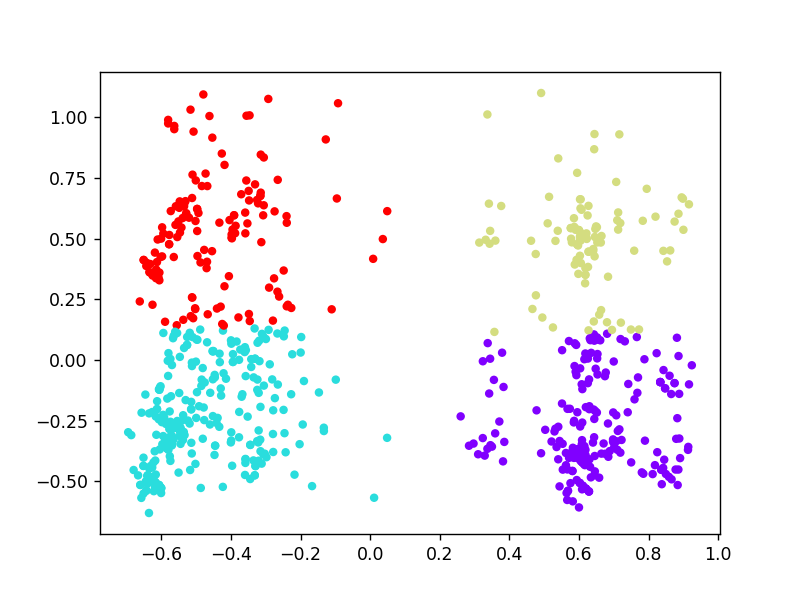

In [213]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['KMeans-Labels-Reduced'],cmap='rainbow',s=15)

### 5.1) Performing Hierarchial Clustering (ward) with reduced features

<IPython.core.display.Javascript object>


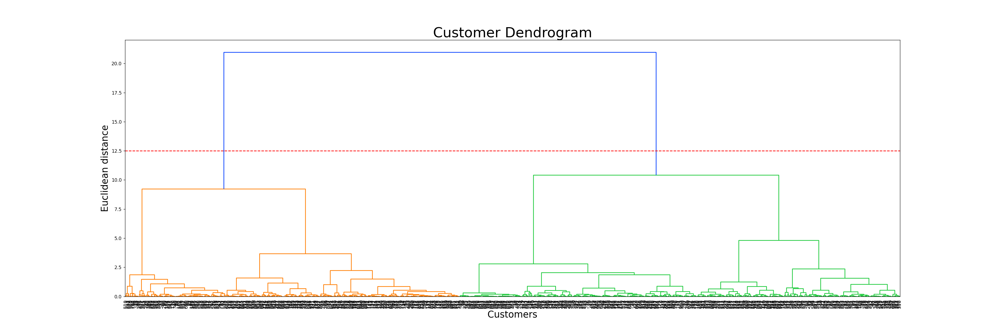

In [214]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(df_r, method = 'ward'))
plt.axhline(y=12.5, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### From the dendrogram we can see that the ideal value for no. of clusters is 2

In [236]:
hc1_reduced = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
y_hc1_reduced = hc1_reduced.fit_predict(df_r)

In [237]:
df['Agglomerative-Labels-reduced']=y_hc1_reduced

In [238]:
df['Agglomerative-Labels-reduced'].value_counts()

0    421
1    319
Name: Agglomerative-Labels-reduced, dtype: int64

In [239]:
silhouette_score(df_r, y_hc1_reduced)

0.5704897450119671

##### We can see that ward-agglomerative clustering silhouette score on reduced features is more compared to all features

In [240]:
df['Agglomerative-Labels-reduced']=y_hc1_reduced

In [241]:
rf_df['Agglomerative-Labels-reduced']=y_hc1_reduced

<IPython.core.display.Javascript object>


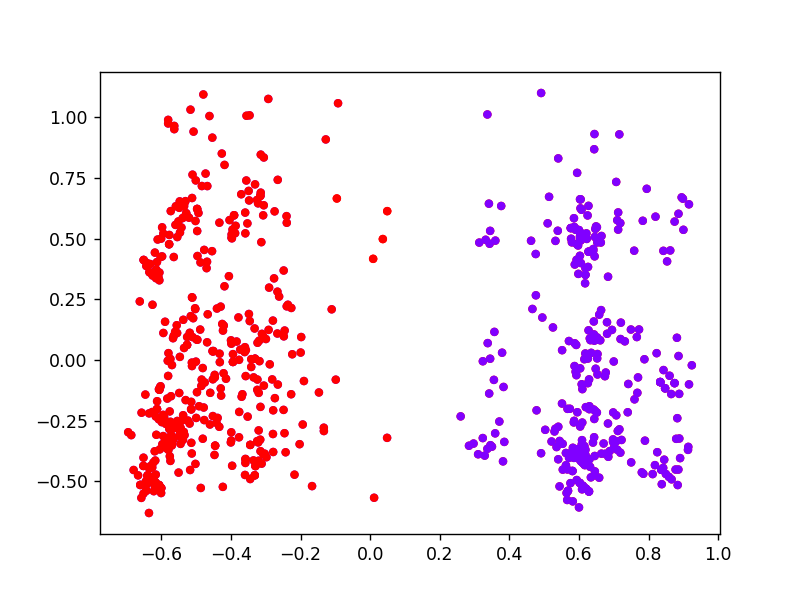

In [242]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['Agglomerative-Labels-reduced'],cmap='rainbow',s=15)

##### We observe that visually the clusters look well seperated using this model

### 5.2) Performing Hierarchial Clustering (single) with reduced features

<IPython.core.display.Javascript object>


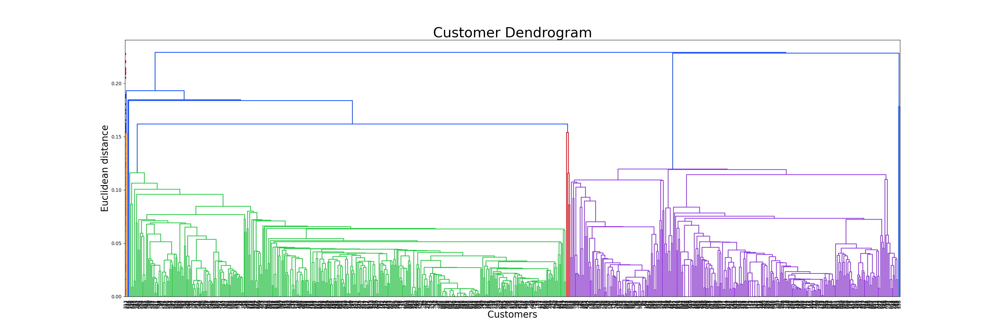

In [243]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(df_r, method = 'single'))
plt.axhline(y=12.5, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### From the dendrogram we cannot visually identify the appropriate number of clusters

In [244]:
for i in range(2,21):
    hc_test=AgglomerativeClustering(n_clusters = i, affinity = 'euclidean', linkage = 'single')
    y_hc_test=hc_test.fit_predict(df_r)
    print('Silhouette score for',i,'clusters is:',silhouette_score(df_r, y_hc_test))

Silhouette score for 2 clusters is: 0.5729920935260224
Silhouette score for 3 clusters is: 0.47076591522029965
Silhouette score for 4 clusters is: 0.3959537478726092
Silhouette score for 5 clusters is: 0.16739163101393212
Silhouette score for 6 clusters is: 0.10779259116651224
Silhouette score for 7 clusters is: 0.10250004369040641
Silhouette score for 8 clusters is: 0.08282311828164214
Silhouette score for 9 clusters is: 0.06191335809599206
Silhouette score for 10 clusters is: 0.05994253986061033
Silhouette score for 11 clusters is: 0.1957065132785082
Silhouette score for 12 clusters is: 0.15439128992955237
Silhouette score for 13 clusters is: 0.09497803032916821
Silhouette score for 14 clusters is: 0.09433294053900793
Silhouette score for 15 clusters is: 0.06793152282224268
Silhouette score for 16 clusters is: 0.058629975820152364
Silhouette score for 17 clusters is: 0.04787933974132594
Silhouette score for 18 clusters is: 0.037983221415215415
Silhouette score for 19 clusters is: 0.0

##### Checking with silhouette score we can say that the ideal number of clusters would be 2

In [286]:
hc2_reduced = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'single')
y_hc2_reduced = hc2_reduced.fit_predict(df_r)

In [287]:
df['Agglomerative-Labels-single-reduced']=y_hc2_reduced

In [288]:
df['Agglomerative-Labels-single-reduced'].value_counts()

1    425
0    315
Name: Agglomerative-Labels-single-reduced, dtype: int64

In [289]:
silhouette_score(df_r, y_hc2_reduced)

0.5729920935260224

##### We can see that the silhouette score for single linkage on reduced features is same as ward linkage on reduced features

In [290]:
df['Agglomerative-Labels-single-reduced']=y_hc2_reduced

In [291]:
rf_df['Agglomerative-Labels-single-reduced']=y_hc2_reduced

<IPython.core.display.Javascript object>


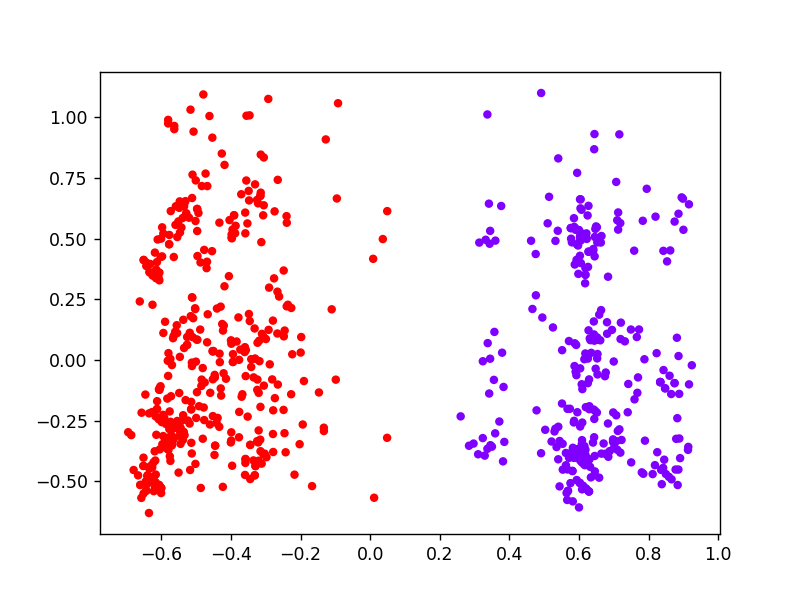

In [292]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['Agglomerative-Labels-single-reduced'],cmap='rainbow',s=15)

##### We observe that visually the clusters look well seperated using this model

### 5.3) Performing Hierarchial Clustering (complete) with reduced features

<IPython.core.display.Javascript object>


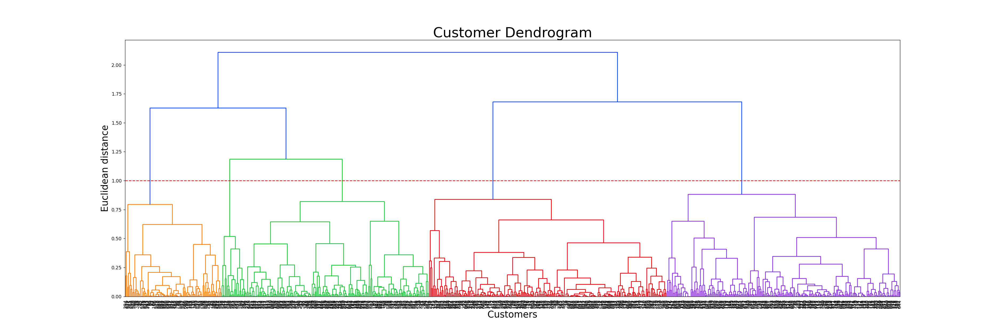

In [234]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(df_r, method = 'complete'))
plt.axhline(y=1, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### From the dendrogram we observe that the ideal value of no. of clusters is 5

In [280]:
hc3_reduced = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage = 'complete')
y_hc3_reduced = hc3_reduced.fit_predict(df_r)

In [281]:
df['Agglomerative-Labels-complete-reduced']=y_hc3_reduced

In [282]:
df['Agglomerative-Labels-complete-reduced'].value_counts()

2    227
0    223
1    174
3     92
4     24
Name: Agglomerative-Labels-complete-reduced, dtype: int64

In [283]:
silhouette_score(df_r, y_hc3_reduced)

0.5116769141509797

##### We observe that the silhouette score is inferior compared to single and ward likage on reduced features

In [284]:
rf_df['Agglomerative-Labels-complete-reduced']=y_hc3_reduced

<IPython.core.display.Javascript object>


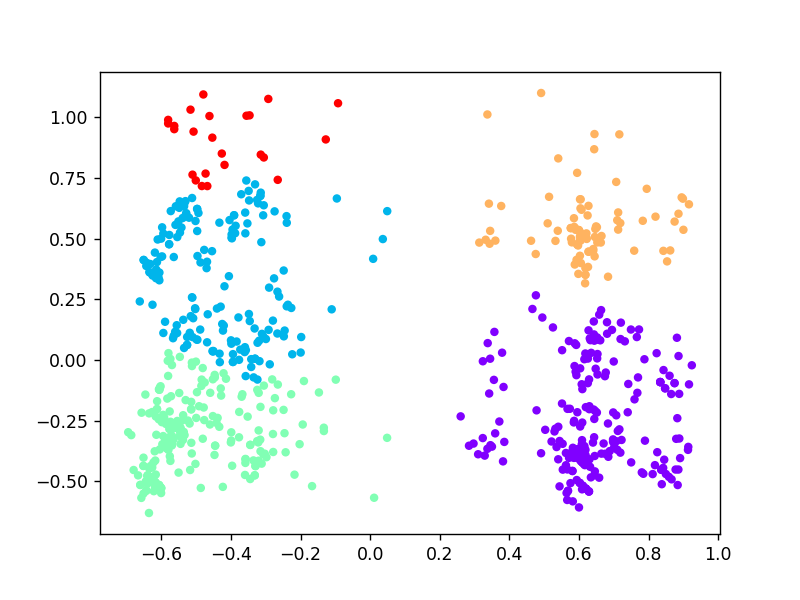

In [285]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['Agglomerative-Labels-complete-reduced'],cmap='rainbow',s=15)

##### We observe that the clusters formed are inaccurate

### 5.4) Performing Hierarchial Clustering (average) with reduced features

<IPython.core.display.Javascript object>


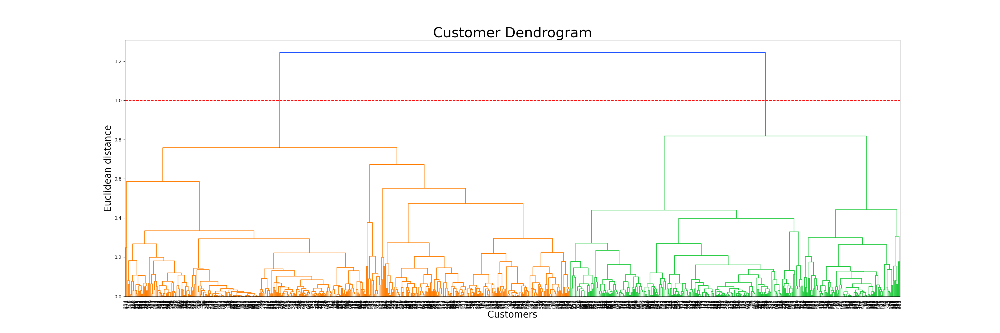

In [293]:
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(df_r, method = 'average'))
plt.axhline(y=1, color='r', linestyle='--')  # cutting line of the dendogram
ax = plt.gca()  # used to create current polar axis on current figure
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Customer Dendrogram',fontsize=30)
plt.xlabel('Customers',fontsize=20)
plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

##### We can see from the dendrogram that the ideal number of clusters is 2

In [294]:
hc4_reduced = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'average')
y_hc4_reduced = hc4_reduced.fit_predict(df_r)

In [295]:
df['Agglomerative-Labels-average-reduced']=y_hc4_reduced

In [296]:
df['Agglomerative-Labels-average-reduced'].value_counts()

1    425
0    315
Name: Agglomerative-Labels-average-reduced, dtype: int64

In [297]:
silhouette_score(df_r, y_hc4_reduced)

0.5729920935260224

##### we can see that the average linkage gives an improved silhouette score compared to the other linkages

In [298]:
rf_df['Agglomerative-Labels-average-reduced']=y_hc4_reduced

<IPython.core.display.Javascript object>


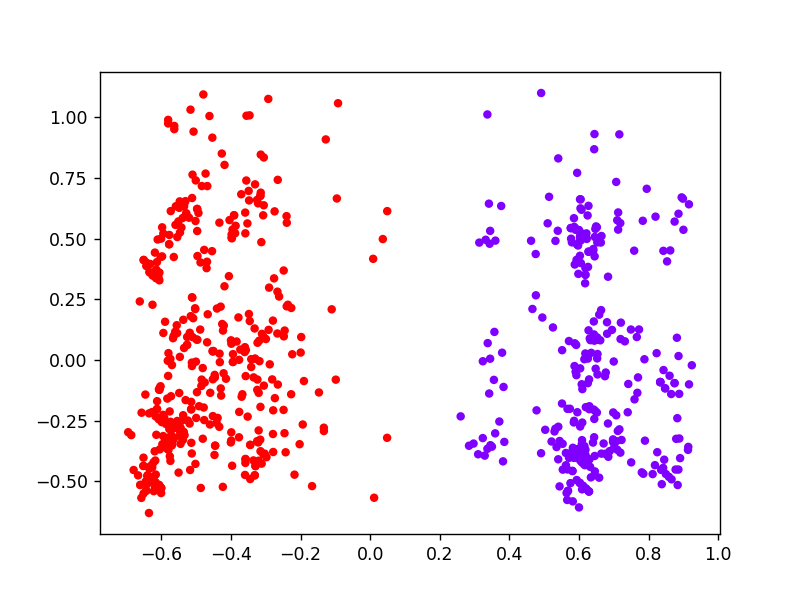

In [299]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['Agglomerative-Labels-average-reduced'],cmap='rainbow',s=15)

##### We can see that the clusters are appropriately formed

### 6) Performing DBSCAN Clustering on reduced data

##### Finding optimum parameters

In [305]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_r)
distances, indices = nbrs.kneighbors(df_r)

<IPython.core.display.Javascript object>


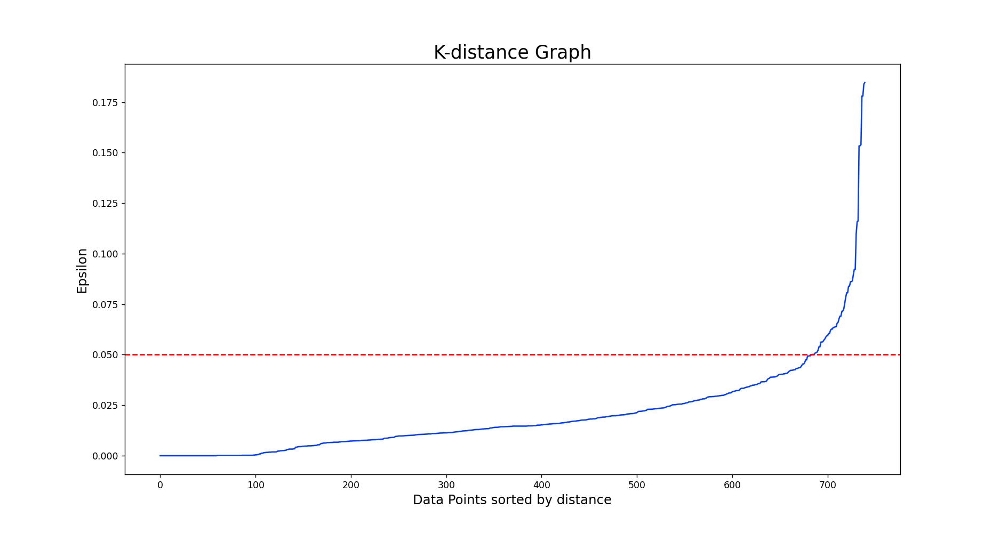

In [306]:
# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(15,8))
plt.plot(distances)
plt.axhline(y=0.05, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

##### Therefore we can say from the elbow graph that the ideal value of epsilon is 0.05

In [308]:
eps=0.05
for min_samples in [11,12,13,14,15,16,17,18,19,20]:
 clusterer = DBSCAN(eps=eps, min_samples=min_samples)
 cluster_labels = clusterer.fit_predict(df_r)
 x= cluster_labels +2
 y = np.bincount(x)
 ii = np.nonzero(y)[0]
 results = list(zip(ii,y[ii]) )
 print('eps=',eps,'| min_samples= ', min_samples, '| obtained clustering: ', results)


eps= 0.05 | min_samples=  11 | obtained clustering:  [(1, 370), (2, 122), (3, 82), (4, 43), (5, 20), (6, 20), (7, 15), (8, 21), (9, 12), (10, 13), (11, 9), (12, 13)]
eps= 0.05 | min_samples=  12 | obtained clustering:  [(1, 399), (2, 121), (3, 80), (4, 43), (5, 20), (6, 19), (7, 12), (8, 21), (9, 12), (10, 13)]
eps= 0.05 | min_samples=  13 | obtained clustering:  [(1, 461), (2, 59), (3, 58), (4, 70), (5, 40), (6, 20), (7, 19), (8, 13)]
eps= 0.05 | min_samples=  14 | obtained clustering:  [(1, 477), (2, 59), (3, 58), (4, 52), (5, 40), (6, 20), (7, 17), (8, 17)]
eps= 0.05 | min_samples=  15 | obtained clustering:  [(1, 480), (2, 59), (3, 57), (4, 52), (5, 39), (6, 20), (7, 17), (8, 16)]
eps= 0.05 | min_samples=  16 | obtained clustering:  [(1, 502), (2, 59), (3, 57), (4, 49), (5, 39), (6, 17), (7, 17)]
eps= 0.05 | min_samples=  17 | obtained clustering:  [(1, 526), (2, 59), (3, 50), (4, 49), (5, 39), (6, 17)]
eps= 0.05 | min_samples=  18 | obtained clustering:  [(1, 546), (2, 59), (3, 48

##### Therefore we can say that the ideal min samples value is 18

In [ ]:
##### Applying DBSCAN model with eps=0.05 and min_samples=18

In [309]:
dbscan_opt=DBSCAN(eps=0.05,min_samples=18)
dbscan_opt.fit(df_r)

DBSCAN(eps=0.05, min_samples=18)

In [310]:
df['DBSCAN_opt_labels_reduced']=dbscan_opt.labels_
df['DBSCAN_opt_labels_reduced'].value_counts()

-1    546
 0     59
 2     49
 1     48
 3     38
Name: DBSCAN_opt_labels_reduced, dtype: int64

##### We see that the most of the datapoints have been treated as outliers and 4 distinct clusters have bben formed

In [311]:
silhouette_score(df_r, dbscan_opt.labels_)

-0.1568509727231187

##### We observe that our silhouette score is -0.15 which is not a very good score.

In [312]:
rf_df['DBSCAN_opt_labels_reduced']=dbscan_opt.labels_

<IPython.core.display.Javascript object>


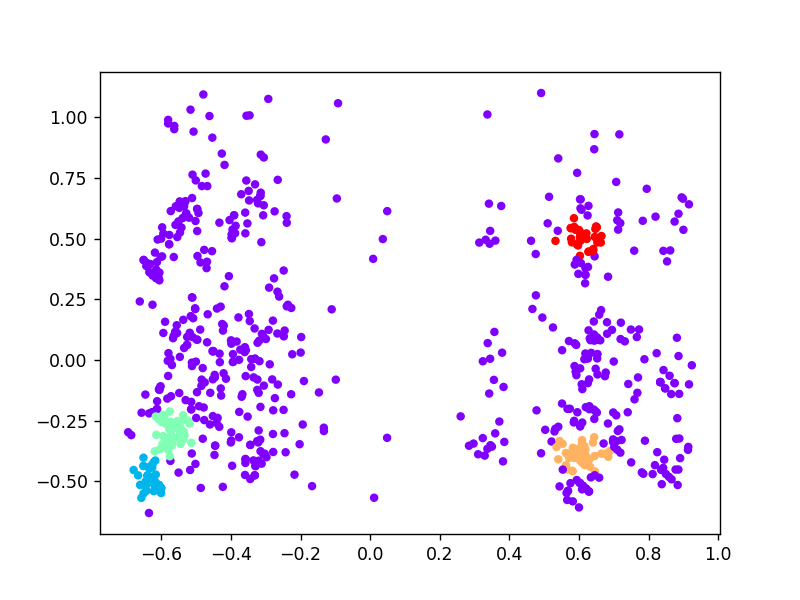

In [313]:
plt.scatter(rf_df['RF1'], rf_df['RF2'], c=rf_df['DBSCAN_opt_labels_reduced'],cmap='rainbow',s=15)

##### We observe that our cluster formation was very week and treated most datapoints as outliers

##### Comparing the clustering models

In [314]:
df_compare=pd.DataFrame()

In [315]:
df_compare['Model']=['KMeans','Agglomerative (ward)','Agglomerative (single)','Agglomerative (complete)','Agglomerative (average)','DBSCAN','KMeans reduced','Agglomerative (ward) reduced','Agglomerative (single) reduced','Agglomerative (complete) reduced','Agglomerative (average) reduced','DBSCAN reduced']

In [316]:
df_compare['Number of Clusters']=[7,2,18,4,4,4,4,2,2,5,2,4]

In [317]:
df_compare['Silhouette Score']=[silhouette_avg_KM,silhouette_score(X, y_hc1),silhouette_score(X, y_hc2),silhouette_score(X, y_hc3),silhouette_score(X, y_hc4),0.01844582128536595,silhouette_avg_KM_reduced,silhouette_score(df_r, y_hc1_reduced),silhouette_score(df_r, y_hc2_reduced),silhouette_score(df_r, y_hc3_reduced),silhouette_score(df_r, y_hc4_reduced),silhouette_score(df_r, dbscan_opt.labels_)]

In [318]:
df_compare

,Model,Number of Clusters,Silhouette Score
0,KMeans,7,0.172697
1,Agglomerative (ward),2,0.197955
2,Agglomerative (single),18,0.135047
3,Agglomerative (complete),4,0.130137
4,Agglomerative (average),4,0.140869
5,DBSCAN,4,0.018446
6,KMeans reduced,4,0.578610
7,Agglomerative (ward) reduced,2,0.570490
8,Agglomerative (single) reduced,2,0.572992
9,Agglomerative (complete) reduced,5,0.511677


### Final Conclusions
##### 1) The silhouette scores for clustering models improved significantly when feature reduction was performed.
##### 2) Nuber of clusters formed when considering all labels was inconsistent but had less variance once feature reduction was performed.
##### 3) Among clustering models performed on all features, Agglomerative model with ward linkage gave the best silhouette score and was minimum in the DBSCAN model.
##### 4) Among clustering models performed on reduced features, KMeans provided the best silhouette score and was minimum in the case of DBSCAN model.
##### 5) Though KMeans gave the highest silhouette score, the cluster formation was best in the case of Agglomerative clustering with average linkage.